# IITM - MLP - Week 6 + 7(partial) + 8 
#### Week 6 except Naive Bays, Week 7 KNN on MNIST, Week 8 SVC
#### KNN on housing and Naibe Byes is in Week 7 notebook

## Imports

In [42]:
# ---------- Common ------------
import os
import time
import json
import random
import ast
from datetime import datetime
from collections import Counter
from pprint import pprint
from statistics import mode

# ---------- Data Manipulation ------------
import pandas as pd
import numpy as np

# ---------- Data Visualization ------------
from pandas.plotting import scatter_matrix
from matplotlib import pyplot as plt
import matplotlib as mpl
from matplotlib.colors import ListedColormap
import seaborn as sns
import plotly.express as px

# ---------- Sklearn ------------
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_validate
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import validation_curve
from sklearn.model_selection import learning_curve
from sklearn.model_selection import ShuffleSplit
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import KFold
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import permutation_test_score

from sklearn.preprocessing import add_dummy_feature
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelBinarizer
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import MaxAbsScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import FunctionTransformer
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import KBinsDiscretizer

# ---------- Sklearn ML Models ------------
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LogisticRegressionCV
from sklearn.linear_model import SGDRegressor
from sklearn.linear_model import Ridge
from sklearn.linear_model import RidgeCV
from sklearn.linear_model import Lasso
from sklearn.linear_model import LassoCV
from sklearn.linear_model import Perceptron
from sklearn.linear_model import SGDClassifier
from sklearn.linear_model import RidgeClassifier
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neighbors import NearestNeighbors
from sklearn.dummy import DummyRegressor
from sklearn.dummy import DummyClassifier

# ---------- Sklearn Metrics ------------
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.metrics import explained_variance_score
from sklearn.metrics import max_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.metrics import plot_roc_curve
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import hinge_loss
from sklearn.metrics import make_scorer
from sklearn.metrics import log_loss

# ---------- Sklearn Abstract ------------
from sklearn.impute import SimpleImputer
from sklearn.impute import KNNImputer

from sklearn.pipeline import Pipeline
from sklearn.pipeline import FeatureUnion
from sklearn.compose import ColumnTransformer
from sklearn.compose import TransformedTargetRegressor
from sklearn.base import BaseEstimator
from sklearn.base import TransformerMixin

from sklearn.decomposition import PCA

from sklearn.feature_extraction import DictVectorizer

from sklearn import set_config

# ---------- Sklearn: Filter based ------------
from sklearn.feature_selection import VarianceThreshold
from sklearn.feature_selection import SelectPercentile
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import GenericUnivariateSelect
from sklearn.feature_selection import mutual_info_classif
from sklearn.feature_selection import mutual_info_regression
from sklearn.feature_selection import chi2
from sklearn.feature_selection import f_classif
from sklearn.feature_selection import f_regression

# ---------- Sklearn: Wrapper based ------------
from sklearn.feature_selection import RFE
from sklearn.feature_selection import RFECV
from sklearn.feature_selection import SequentialFeatureSelector
from sklearn.feature_selection import SelectFromModel

# ---------- Sklearn Datasets ------------
from sklearn.datasets import load_iris
from sklearn.datasets import fetch_california_housing
from sklearn.datasets import make_blobs
from sklearn.datasets import make_regression
from sklearn.datasets import make_classification
from sklearn.datasets import make_multilabel_classification

# ---------- Sklearn External Datasets ------------
from sklearn.datasets import fetch_openml

# ---------- Imblearn ------------
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import RandomOverSampler
from imblearn.over_sampling import SMOTE

# ---------- Scipy ------------
from scipy import stats
from scipy.stats import pearsonr
from scipy.stats import spearmanr
from scipy.stats import kendalltau
from scipy.stats import loguniform
from scipy.stats import uniform

# ---------- Extras ------------
import pickle
# pickle.dump(model, open(filename, 'wb'))
# loaded_model = pickle.load(open(filename, 'rb'))

import tempfile

import warnings
warnings.filterwarnings("ignore")  # supress all warning (use with care)

## Presets

In [2]:
pd.set_option('display.max_rows', 50)
pd.set_option('display.max_columns', None)

plt.style.use('seaborn')
sns.set_theme(style="whitegrid")
# custom_params = {"axes.spines.right": False, "axes.spines.top": False}
# sns.set_theme(style="ticks", rc=custom_params)

set_config(display='diagram')

np.random.seed(42)
# cv = ShuffleSplit(n_splits=10, test_size=0.2, random_state=0)

mpl.rc("axes", labelsize=14)
mpl.rc("xtick", labelsize=12)
mpl.rc("ytick", labelsize=12)
mpl.rc("figure", figsize=(8,6))

## Common helper functions

In [3]:
def display_scores(scores):
    print(f'Scores: {scores}')
    print(f'Mean: {scores.mean()}')
    print(f'Std Dev: {scores.std()}')
    return

def multiple_scores(y_true, y_pred):
    Functions = [explained_variance_score, max_error, mean_absolute_error, mean_squared_error, r2_score]
    Names = ("Explained variance score : ", "Max Error : ", "Mean Absolute Error :", "Mean Squared Error: ", "R squared score: ")
    for func,name in zip(Functions, Names):
        print(name, func(y_true, y_pred))
        
        
class uniform_int:
    """ Integer output of uniform disribution """
    def __init__(self):
        self._distribution = uniform(a,b)
    
    def rvs(self, *args, **kwargs):
        return self._distribution.rvs(*args, **kwargs).astype(int)

## Load Data: MNIST Digits

In [4]:
# # Takes a lot of time for downloading dataset
# X, y = fetch_openml("mnist_784", version=1, return_X_y=True) # returns tuple of data dataframe and label dataframe
# print(f"Shape of X: {X.shape}") # pixels per image = 784 = 28*28
# print(f"Shape of y: {y.shape}")

# # Shape of X: (70000, 784)
# # Shape of y: (70000,)

Shape of X: (70000, 784)
Shape of y: (70000,)


# Data Exploration

## Data  type

In [5]:
# Converts pandas object to np array
X = X.to_numpy()
y = y.to_numpy()

In [6]:
target_names = np.unique(y)

print(f"No. of samples: {X.shape[0]}")
print(f"Type: {X.dtype}")
print(f"Min val: {X.min()} | Max val: {X.max()}")
print(f"No. of classes: {len(target_names)}")
print(f"Type: {y.dtype}")
print(f"Labels: {target_names}")

No. of samples: 70000
Type: float64
Min val: 0.0 | Max val: 255.0
No. of classes: 10
Type: object
Labels: ['0' '1' '2' '3' '4' '5' '6' '7' '8' '9']


## Data Scaling

In [12]:
# X values range from 0 to 255. We can transform it to 0 and 1 using MinMaxScaler
#  Scaling is MUST for using sigmoid function.
#  We are using SGDClassifier here to detect 0. (image is 0 or not 0 mean binary classification)

# X = MinMaxScaler().fit_transform(X)
print(f"Min val: {X.min()} | Max val: {X.max()}")

Min val: 0.0 | Max val: 1.0


## Data Visualization

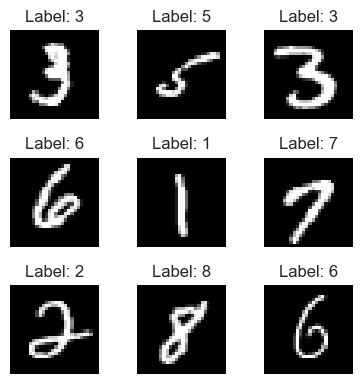

In [13]:
# Image visualization
n = 3
fig, ax = plt.subplots(nrows=n, ncols=n, sharex=True, sharey=True, figsize=(4,4))
offset = 10
for i in range(n):
    index = offset + i*n
    for j in range(n):
        ax[i,j].imshow(X[index+j].reshape(28,28), cmap="gray")
        ax[i,j].set_title(f"Label: {y[index+j]}")
        ax[i,j].set_axis_off()
plt.tight_layout()
plt.show()

## Data Spliting

In [7]:
# total 70000, train 60000, test 10000
samp = 60000
x_train, x_test, y_train, y_test = X[:samp], X[samp:], y[:samp], y[samp:] 

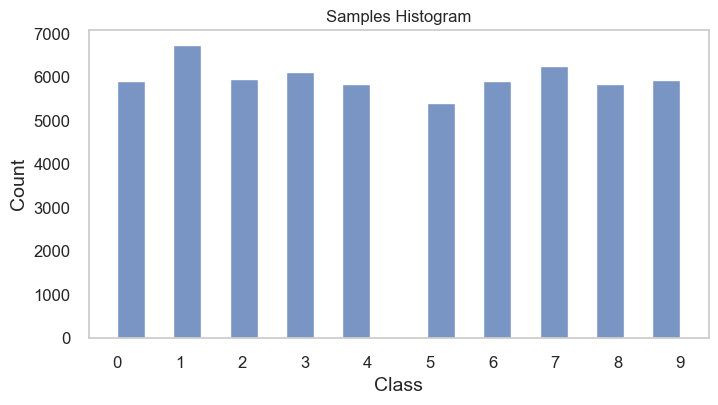

In [16]:
plt.figure(figsize=(8,4))
sns.histplot(data=np.int8(y_train), binwidth=0.45, bins=11)
plt.xticks(ticks=[0,1,2,3,4,5,6,7,8,9], labels=[0,1,2,3,4,5,6,7,8,9])
plt.xlabel("Class")
plt.ylabel("Count")
plt.title("Samples Histogram")
plt.grid(False)
plt.show()

# Binary Classification: digit '0' detector : Logistic Regression Model using SGDClassifier

## Modify labels: 0:1, other:0

In [17]:
# in perceptron we set 0 label to 1 and all other to -1
#  here in SGDClassifier we will set 0 label to 1 and other to 0 (we are using  sigmoid function [0,1] )

y_train_0 = np.zeros((len(y_train))) # all other are set to 0
y_test_0 = np.zeros((len(y_test)))

indx_0 = np.where(y_train == "0") # find indexes of digit 0 and set it to 1
y_train_0[indx_0] = 1

indx_0 = np.where(y_test == "0") # find indexes of digit 0
y_test_0[indx_0] = 1

## Sanity check

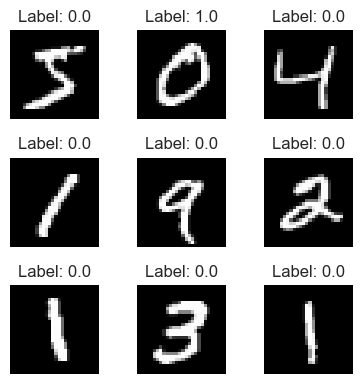

In [18]:
# Image visualization
n = 3
fig, ax = plt.subplots(nrows=n, ncols=n, sharex=True, sharey=True, figsize=(4,4))
offset = 0
for i in range(n):
    index = offset + i*n
    for j in range(n):
        ax[i,j].imshow(X[index+j].reshape(28,28), cmap="gray")
        ax[i,j].set_title(f"Label: {y_train_0[index+j]}")
        ax[i,j].set_axis_off()
plt.tight_layout()
plt.show()

## Baseline model

In [20]:
print(f"Number of 0 digits: {len(np.where(y_train_0==1)[0])}")
print(f"Number of other digits: {len(np.where(y_train_0==0)[0])}")

Number of 0 digits: 5923
Number of other digits: 54077


In [21]:
54077/(54077+5923)

0.9012833333333333

In [22]:
# Now we can see that there is class imbalance
# only 10% data is +1 class
# if our model predicts output as -1 without training then the output accuracy will be 90.12 %

In [23]:
base_clf = DummyClassifier(strategy='most_frequent')
base_clf.fit(x_train, y_train_0)

print(f"Training accuracy: {round(base_clf.score(x_train, y_train_0), 3)}")
print(f"Test accuracy: {round(base_clf.score(x_test, y_test_0), 3)}")

Training accuracy: 0.901
Test accuracy: 0.902


In [24]:
# So accuracy is not a good measure

## SGDClassifier

### Base model with iteration vs loss curve

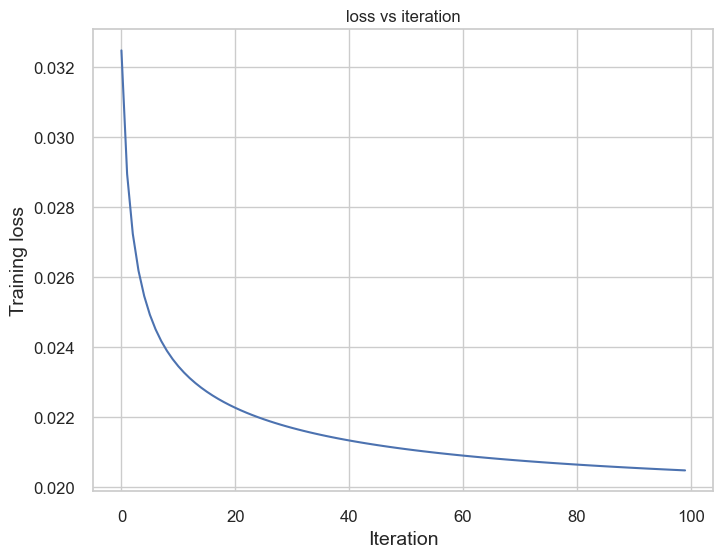

In [25]:
# logistic regression: z = w.t@x
#     output: sigmoid(z) i.e. 1/(1+ e^-z)
#  it uses cross entropy loss function

#  we will implement logistic regression using sgdclassifier with loss="log"
# it is same is SGDClassifier(loss="log")

#  first we will plot iteration vs loss curve using fit method (partial fit can also be used)

bin_sgd_clf = SGDClassifier(loss="log",
                        penalty="l2",
                        warm_start=True,
                        eta0=0.01,
                        alpha=0,
                        learning_rate="constant",
                        max_iter=1, 
                        random_state=1729)
# regularization is zero because alpha=0

Loss = []
iterations = 100
for i in range(iterations):
    bin_sgd_clf.fit(x_train, y_train_0)
    y_pred = bin_sgd_clf.predict_proba(x_train)
    Loss.append(log_loss(y_train_0, y_pred))
    
plt.figure(figsize=(8,6))
plt.plot(np.arange(iterations), Loss, "b-")
plt.ylabel("Training loss")
plt.xlabel("Iteration")
plt.title("loss vs iteration")
plt.grid(True)
plt.show()

In [26]:
# this is a ideal learning curve if model is getting trained properly. loss reducing per iterations.

In [27]:
print(f"Training score: {round(bin_sgd_clf.score(x_train, y_train_0), 3)}")
print(f"Test score: {round(bin_sgd_clf.score(x_test, y_test_0), 3)}")

Training score: 0.994
Test score: 0.992


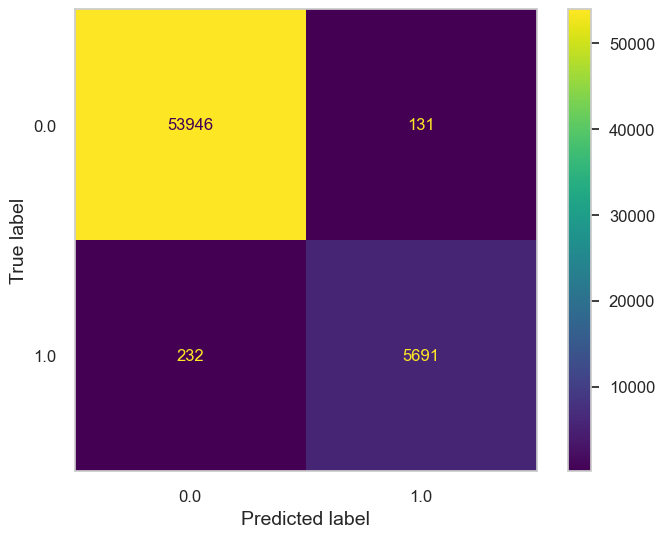

In [29]:
y_hat_train_0 = bin_sgd_clf.predict(x_train) # using training data
cm_disp = ConfusionMatrixDisplay.from_predictions(y_train_0, y_hat_train_0)
plt.grid(False)
plt.show()

In [30]:
print(classification_report(y_train_0, y_hat_train_0))

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     54077
         1.0       0.98      0.96      0.97      5923

    accuracy                           0.99     60000
   macro avg       0.99      0.98      0.98     60000
weighted avg       0.99      0.99      0.99     60000



### Cross Validate

In [31]:
estimator = SGDClassifier(loss="log",
                        penalty="l2",
                        warm_start=False,
                        eta0=0.01,
                        alpha=0,
                        learning_rate="constant",
                        max_iter=100, 
                        random_state=1729) # no regularization

cv_bin_clf = cross_validate(estimator,
                      x_train,
                      y_train_0,
                      cv=5,
                      scoring=['precision', 'recall', 'f1'],
                      return_train_score=True,
                      return_estimator=True)

pprint(cv_bin_clf)

{'estimator': [SGDClassifier(alpha=0, eta0=0.01, learning_rate='constant', loss='log',
              max_iter=100, random_state=1729),
               SGDClassifier(alpha=0, eta0=0.01, learning_rate='constant', loss='log',
              max_iter=100, random_state=1729),
               SGDClassifier(alpha=0, eta0=0.01, learning_rate='constant', loss='log',
              max_iter=100, random_state=1729),
               SGDClassifier(alpha=0, eta0=0.01, learning_rate='constant', loss='log',
              max_iter=100, random_state=1729),
               SGDClassifier(alpha=0, eta0=0.01, learning_rate='constant', loss='log',
              max_iter=100, random_state=1729)],
 'fit_time': array([1.65262699, 1.56821632, 1.51076865, 1.52570224, 1.29143023]),
 'score_time': array([0.03262615, 0.05605197, 0.03128552, 0.11061454, 0.03123426]),
 'test_f1': array([0.95699831, 0.954371  , 0.9616041 , 0.95870583, 0.95993252]),
 'test_precision': array([0.95538721, 0.96382429, 0.97238999, 0.96735395, 0.9

In [32]:
# We can see that logistic regression performing better than perceptron (week 5)

In [33]:
weights = bin_sgd_clf.coef_
bias = bin_sgd_clf.intercept_
print(f"Dim of weights: {weights.shape}")
print(f"Bias: {bias}")

Dim of weights: (1, 784)
Bias: [-4.89282893]


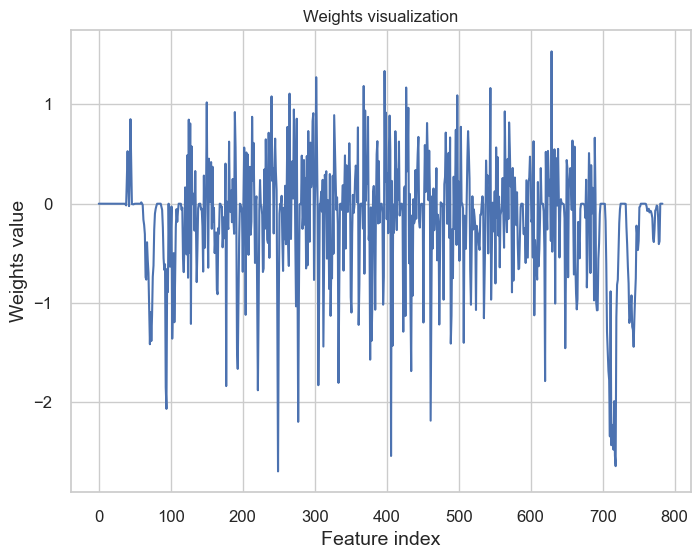

In [34]:
plt.plot(np.arange(0,784), weights[0,:])
plt.ylabel("Weights value")
plt.xlabel("Feature index")
plt.title("Weights visualization")
plt.grid(True)
plt.show()

In [36]:
print(f"no. of feat with weight 0: {weights.shape[1] - np.count_nonzero(weights)}")

no. of feat with weight 0: 67


In [37]:
#  Also weights are not very high value so regularization is not required in this case.
#  Below regularization is for demo

### Base model with regularization

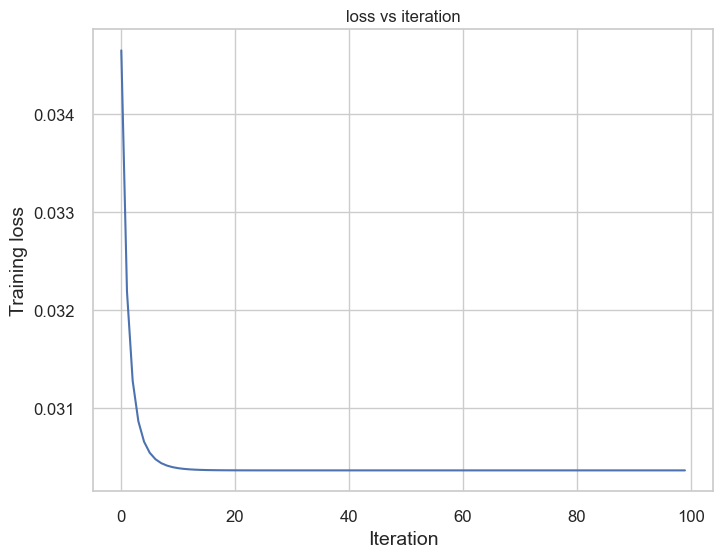

In [38]:
bin_sgd_clf_l2 = SGDClassifier(loss="log",
                        penalty="l2",
                        warm_start=True,
                        eta0=0.01,
                        alpha=0.001,
                        learning_rate="constant",
                        max_iter=1, 
                        random_state=1729)

Loss = []
iterations = 100
for i in range(iterations):
    bin_sgd_clf_l2.fit(x_train, y_train_0)
    y_pred = bin_sgd_clf_l2.predict_proba(x_train)
    Loss.append(log_loss(y_train_0, y_pred))
    
plt.figure(figsize=(8,6))
plt.plot(np.arange(iterations), Loss, "b-")
plt.ylabel("Training loss")
plt.xlabel("Iteration")
plt.title("loss vs iteration")
plt.grid(True)
plt.show()

In [40]:
# this is a ideal learning curve if model is getting trained properly. 
# loss reducing per iterations.
# But loss if slightly higher than non regularized version

In [41]:
print(f"Training score: {round(bin_sgd_clf_l2.score(x_train, y_train_0), 3)}")
print(f"Test score: {round(bin_sgd_clf_l2.score(x_test, y_test_0), 3)}")

Training score: 0.991
Test score: 0.99


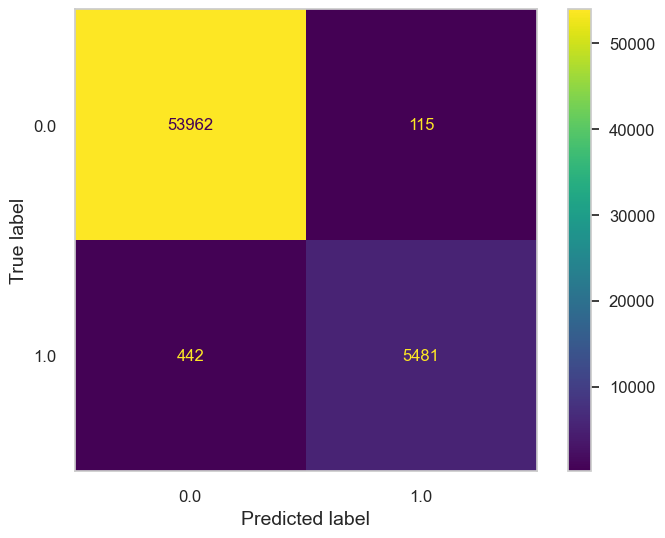

In [42]:
y_hat_train_0 = bin_sgd_clf_l2.predict(x_train) # using training data
cm_disp = ConfusionMatrixDisplay.from_predictions(y_train_0, y_hat_train_0)
plt.grid(False)
plt.show()

In [43]:
print(classification_report(y_train_0, y_hat_train_0))

              precision    recall  f1-score   support

         0.0       0.99      1.00      0.99     54077
         1.0       0.98      0.93      0.95      5923

    accuracy                           0.99     60000
   macro avg       0.99      0.96      0.97     60000
weighted avg       0.99      0.99      0.99     60000



In [44]:
weights = bin_sgd_clf_l2.coef_
bias = bin_sgd_clf_l2.intercept_
print(f"Dim of weights: {weights.shape}")
print(f"Bias: {bias}")

Dim of weights: (1, 784)
Bias: [-4.43002876]


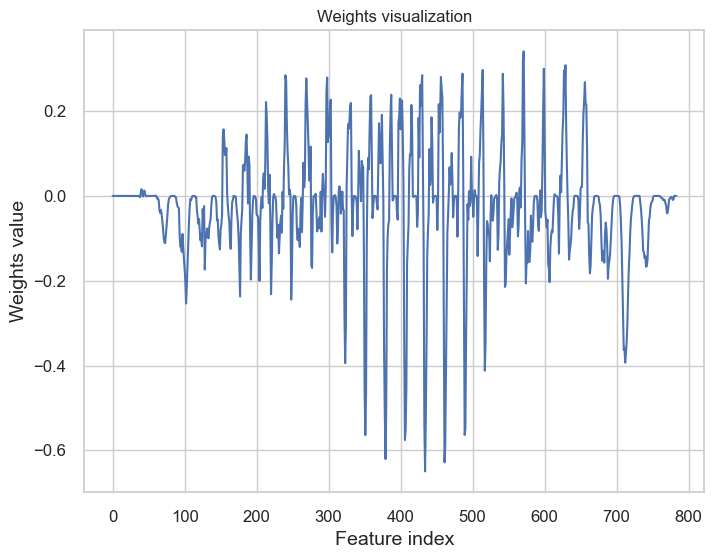

In [45]:
plt.plot(np.arange(0,784), weights[0,:])
plt.ylabel("Weights value")
plt.xlabel("Feature index")
plt.title("Weights visualization")
plt.grid(True)
plt.show()

In [46]:
print(f"no. of feat with weight 0: {weights.shape[1] - np.count_nonzero(weights)}")

no. of feat with weight 0: 67


### Display Predictions

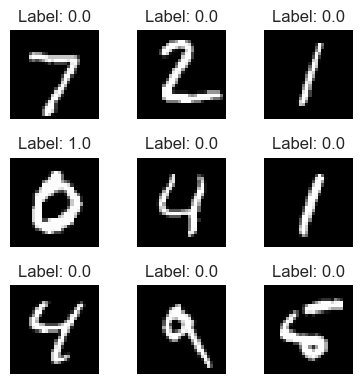

In [47]:
# Image visualization
y_hat_test_0 = bin_sgd_clf.predict(x_test)

n = 3
fig, ax = plt.subplots(nrows=n, ncols=n, sharex=True, sharey=True, figsize=(4,4))
offset = 0
for i in range(n):
    index = offset + i*n
    for j in range(n):
        ax[i,j].imshow(x_test[index+j].reshape(28,28), cmap="gray")
        ax[i,j].set_title(f"Label: {y_hat_test_0[index+j]}")
        ax[i,j].set_axis_off()
plt.tight_layout()
plt.show()

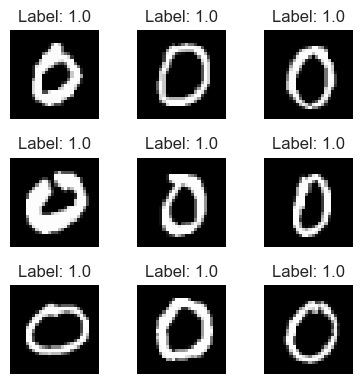

In [48]:
# Image visualization
indx_0 = np.where(y_test_0 == 1) # 0 digit images
zeroImgs = x_test[indx_0[0]]
zeroLabels = y_hat_test_0[indx_0[0]]

n = 3
fig, ax = plt.subplots(nrows=n, ncols=n, sharex=True, sharey=True, figsize=(4,4))
offset = 0
for i in range(n):
    index = offset + i*n
    for j in range(n):
        ax[i,j].imshow(zeroImgs[index+j].reshape(28,28), cmap="gray")
        ax[i,j].set_title(f"Label: {zeroLabels[index+j]}")
        ax[i,j].set_axis_off()
plt.tight_layout()
plt.show()

## Hyper param tuning

In [50]:
#  learning rate eta0
#  regularization rate alpha

lr_grid = loguniform(1e-2, 1e-1)
lr_grid.rvs(3)

array([0.02368864, 0.0892718 , 0.05395031])

In [51]:
estimator = SGDClassifier(loss="log",
                        penalty="l2",
                        warm_start=True,
                        eta0=0.01,
                        alpha=0,
                        learning_rate="constant",
                        max_iter=1, 
                        random_state=1729) # no regularization

scores = RandomizedSearchCV(estimator,
                                    param_distributions={"eta0":lr_grid},
                                    scoring=['precision', 'recall', 'f1'],
                                    cv=5,
                                    n_iter=5,
                                    refit="f1")

scores.fit(x_train, y_train_0)

RandomizedSearchCV(cv=5,
                   estimator=SGDClassifier(alpha=0, eta0=0.01,
                                           learning_rate='constant', loss='log',
                                           max_iter=1, random_state=1729,
                                           warm_start=True),
                   n_iter=5,
                   param_distributions={'eta0': <scipy.stats._distn_infrastructure.rv_frozen object at 0x0000026192C9F910>},
                   refit='f1', scoring=['precision', 'recall', 'f1'])

In [52]:
pprint(scores.cv_results_)

{'mean_fit_time': array([0.50627055, 0.39952536, 0.42529473, 0.3818604 , 0.37146015]),
 'mean_score_time': array([0.05293245, 0.03257947, 0.03614221, 0.03917184, 0.04063549]),
 'mean_test_f1': array([0.95090017, 0.95474878, 0.95474878, 0.95312044, 0.94413766]),
 'mean_test_precision': array([0.9540212 , 0.96640269, 0.96640269, 0.96654026, 0.94109525]),
 'mean_test_recall': array([0.94850966, 0.94361173, 0.94361173, 0.94023478, 0.94834203]),
 'param_eta0': masked_array(data=[0.039687933304443715, 0.01432249371823025,
                   0.014321698289111515, 0.011430983876313219,
                   0.07348118405270448],
             mask=[False, False, False, False, False],
       fill_value='?',
            dtype=object),
 'params': [{'eta0': 0.039687933304443715},
            {'eta0': 0.01432249371823025},
            {'eta0': 0.014321698289111515},
            {'eta0': 0.011430983876313219},
            {'eta0': 0.07348118405270448}],
 'rank_test_f1': array([4, 1, 1, 3, 5]),
 'rank_te

In [53]:
scores.best_params_

{'eta0': 0.01432249371823025}

In [54]:
best_bin_clf = scores.best_estimator_
y_hat_train_best_0 = best_bin_clf.predict(x_train)
print(classification_report(y_train_0, y_hat_train_best_0))

              precision    recall  f1-score   support

         0.0       0.99      1.00      0.99     54077
         1.0       0.98      0.92      0.95      5923

    accuracy                           0.99     60000
   macro avg       0.99      0.96      0.97     60000
weighted avg       0.99      0.99      0.99     60000



## Ploting curves

### Threshold Curve

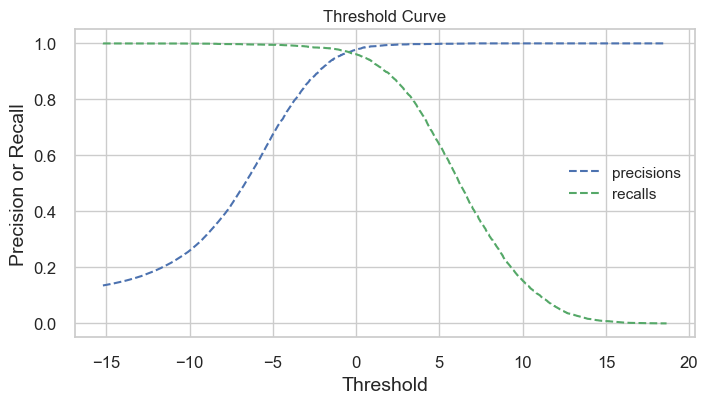

In [56]:
y_scores = bin_sgd_clf.decision_function(x_train)
precisions, recalls, thresholds = precision_recall_curve(y_train_0, y_scores, pos_label=1)

plt.figure(figsize=(8,4))
plt.plot(thresholds, precisions[:-1], "b--", label="precisions")
plt.plot(thresholds, recalls[:-1], "g--", label="recalls")
plt.ylabel("Precision or Recall")
plt.xlabel("Threshold")
plt.title("Threshold Curve")
plt.grid(True)
plt.legend()
plt.show()

### PR Curve

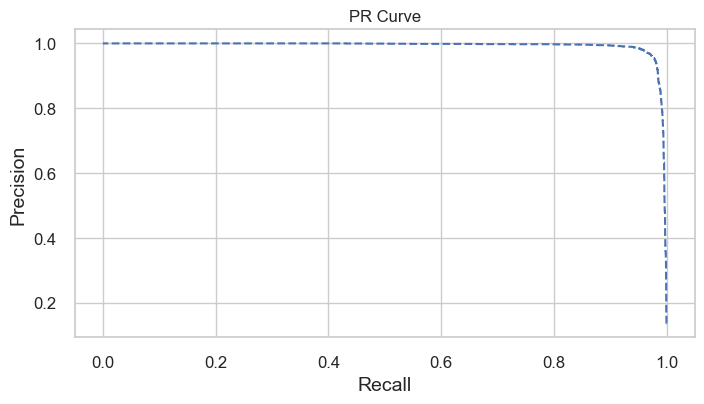

In [59]:
plt.figure(figsize=(8,4))
plt.plot(recalls, precisions, "b--")
plt.ylabel("Precision")
plt.xlabel("Recall")
plt.title("PR Curve")
plt.grid(True)
plt.show()

### ROC Curve

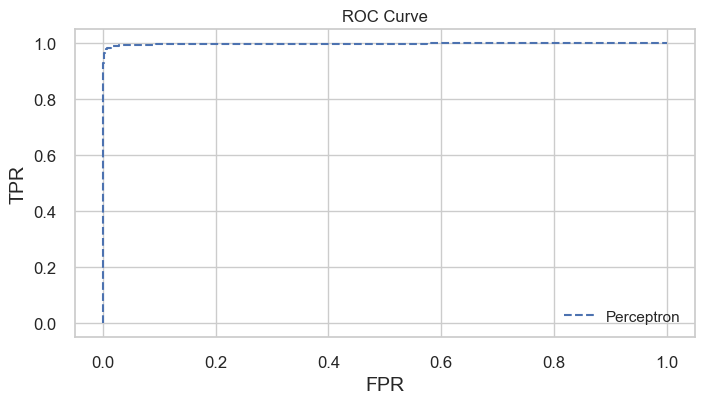

In [61]:
fpr, tpr, thresholds = roc_curve(y_train_0, y_scores)

plt.figure(figsize=(8,4))
plt.plot(fpr, tpr, "b--", label="Perceptron")
plt.ylabel("TPR")
plt.xlabel("FPR")
plt.title("ROC Curve")
plt.grid(True)
plt.legend()
plt.show()

In [62]:
auc = roc_auc_score(y_train_0, y_scores)
print(f"AUC score: {auc}")

AUC score: 0.9984853545995911


# Binary Classification: digit '0' detector : Logistic Regression

In [63]:
# Logistic regression solvers: liblinear, newton-cg, sag, saga, lbfgs to find optimal weights
# Defaults: penalty='l2', c=1, solver='lbfgs'
# to set no regularization C=infinity

## Training without regularization

In [64]:
pipe_logit = Pipeline(steps=[( "scaler", MinMaxScaler() ),
                             ( "logit", LogisticRegression(solver="lbfgs",
                                                          C=np.infty,
                                                          random_state=1729) )])
pipe_logit.fit(x_train, y_train_0)

Pipeline(steps=[('scaler', MinMaxScaler()),
                ('logit', LogisticRegression(C=inf, random_state=1729))])

In [65]:
print(f"Training accuracy: {round(pipe_logit.score(x_train, y_train_0), 3)}")
print(f"Test accuracy: {round(pipe_logit.score(x_test, y_test_0), 3)}")

Training accuracy: 0.994
Test accuracy: 0.991


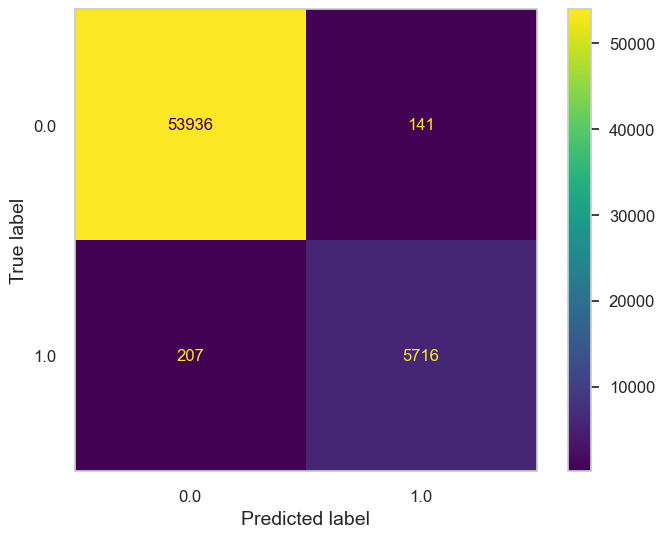

In [66]:
logit_cv_train_0 = pipe_logit.predict(x_train) # using training data
cm_disp = ConfusionMatrixDisplay.from_predictions(y_train_0, y_hat_train_0)
plt.grid(False)
plt.show()

In [67]:
print(classification_report(y_train_0, y_hat_train_0))

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     54077
         1.0       0.98      0.97      0.97      5923

    accuracy                           0.99     60000
   macro avg       0.99      0.98      0.98     60000
weighted avg       0.99      0.99      0.99     60000



## Hyper param tuning

### Using GridSearchCV

In [68]:
pipe = Pipeline(steps=[( "scaler", MinMaxScaler() ),
                             ( "logistic", LogisticRegression(C=1.0,
                                                              random_state=1729) )])

grid_Cs = [0, 1e-4, 1e-3, 1e-2, 1e-1, 1.0, 10.0, 100.0]

pipe_logit_cv = GridSearchCV(pipe,
                            param_grid={"logistic__C":grid_Cs},
                            scoring="f1")

pipe_logit_cv.fit(x_train, y_train_0)

GridSearchCV(estimator=Pipeline(steps=[('scaler', MinMaxScaler()),
                                       ('logistic',
                                        LogisticRegression(random_state=1729))]),
             param_grid={'logistic__C': [0, 0.0001, 0.001, 0.01, 0.1, 1.0, 10.0,
                                         100.0]},
             scoring='f1')

In [69]:
pprint(pipe_logit_cv.cv_results_)

{'mean_fit_time': array([0.83004971, 2.3922688 , 3.23300114, 5.29998922, 8.89890723,
       8.3330822 , 8.72029681, 8.33479891]),
 'mean_score_time': array([0.        , 0.10748558, 0.11402273, 0.12854233, 0.10849981,
       0.10250483, 0.13056517, 0.10310297]),
 'mean_test_score': array([       nan, 0.74968147, 0.92290366, 0.95088967, 0.9579655 ,
       0.9578444 , 0.95363134, 0.95286093]),
 'param_logistic__C': masked_array(data=[0, 0.0001, 0.001, 0.01, 0.1, 1.0, 10.0, 100.0],
             mask=[False, False, False, False, False, False, False, False],
       fill_value='?',
            dtype=object),
 'params': [{'logistic__C': 0},
            {'logistic__C': 0.0001},
            {'logistic__C': 0.001},
            {'logistic__C': 0.01},
            {'logistic__C': 0.1},
            {'logistic__C': 1.0},
            {'logistic__C': 10.0},
            {'logistic__C': 100.0}],
 'rank_test_score': array([8, 7, 6, 5, 1, 2, 3, 4]),
 'split0_test_score': array([       nan, 0.77113402, 0.924

In [70]:
pipe_logit_cv.best_params_

{'logistic__C': 0.1}

In [71]:
pipe_logit_cv.best_score_

0.9579654953103655

In [72]:
pipe_logit_cv.best_estimator_

Pipeline(steps=[('scaler', MinMaxScaler()),
                ('logistic', LogisticRegression(C=0.1, random_state=1729))])

### Using LogisticRegressionCV

In [74]:
# LogisticRegressionCV by defaults refits model based on best params

logit_cv = Pipeline(steps=[( "scaler", MinMaxScaler() ),
                        ( "logistic", LogisticRegressionCV(scoring="f1",
                                                         random_state=1729,
                                                          cv=5) )])

logit_cv.fit(x_train, y_train_0)

Pipeline(steps=[('scaler', MinMaxScaler()),
                ('logistic',
                 LogisticRegressionCV(cv=5, random_state=1729, scoring='f1'))])

## Performace evaulation

In [75]:
# pipe_logit : no regularization
# pipe_logit_cv : with gridsearchcv
# logit_cv : with logisticregressioncv

lr_y_hat_0 = pipe_logit.predict(x_test) 
lr_gs_y_hat_0 = pipe_logit_cv.best_estimator_.predict(x_test) 
lr_cv_y_hat_0 = logit_cv.predict(x_test) 

precision_lr = precision_score(y_test_0, lr_y_hat_0)
recall_lr = recall_score(y_test_0, lr_y_hat_0)

precision_lr_gs = precision_score(y_test_0, lr_gs_y_hat_0)
recall_lr_gs = recall_score(y_test_0, lr_gs_y_hat_0)

precision_lr_cv = precision_score(y_test_0, lr_cv_y_hat_0)
recall_lr_cv = recall_score(y_test_0, lr_cv_y_hat_0)

print(f"LogReg without regularization : P: {precision_lr} || R: {recall_lr}")
print(f"LogReg with grid search : P: {precision_lr_gs} || R: {recall_lr_gs}")
print(f"LogReg with log reg cv : P: {precision_lr_cv} || R: {recall_lr_cv}")

LogReg without regularization : P: 0.9515151515151515 || R: 0.9612244897959183
LogReg with grid search : P: 0.9564336372847011 || R: 0.963265306122449
LogReg with log reg cv : P: 0.9546370967741935 || R: 0.9663265306122449


### PR Curve

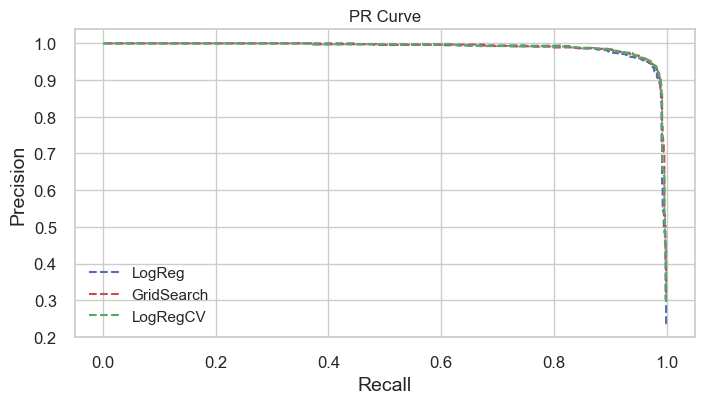

In [76]:
y_scores_lr = pipe_logit.decision_function(x_test)
precisions_lr, recalls_lr, thresholds_lr = precision_recall_curve(y_test_0, y_scores_lr, pos_label=1)

y_scores_lr_gs = pipe_logit_cv.decision_function(x_test)
precisions_lr_gs, recalls_lr_gs, thresholds_lr_gs = precision_recall_curve(y_test_0, y_scores_lr_gs, pos_label=1)

y_scores_lr_cv = logit_cv.decision_function(x_test)
precisions_lr_cv, recalls_lr_cv, thresholds_lr_cv = precision_recall_curve(y_test_0, y_scores_lr_cv, pos_label=1)

plt.figure(figsize=(8,4))
plt.plot(recalls_lr, precisions_lr, "b--", label="LogReg")
plt.plot(recalls_lr_gs, precisions_lr_gs, "r--", label="GridSearch")
plt.plot(recalls_lr_cv, precisions_lr_cv, "g--", label="LogRegCV")
plt.ylabel("Precision")
plt.xlabel("Recall")
plt.title("PR Curve")
plt.grid(True)
plt.legend()
plt.show()

In [80]:
from sklearn.metrics import auc
auc_lr = auc(recalls_lr, precisions_lr)
auc_lr_gs = auc(recalls_lr_gs, precisions_lr_gs)
auc_lr_cv = auc(recalls_lr_cv, precisions_lr_cv)

print(f"Logreg auc: {auc_lr}")
print(f"Grid auc: {auc_lr_gs}")
print(f"LogregCV auc: {auc_lr_cv}")

Logreg auc: 0.988154157939231
Grid auc: 0.9896724785220581
LogregCV auc: 0.9896505899834003


### Confusion Matrix

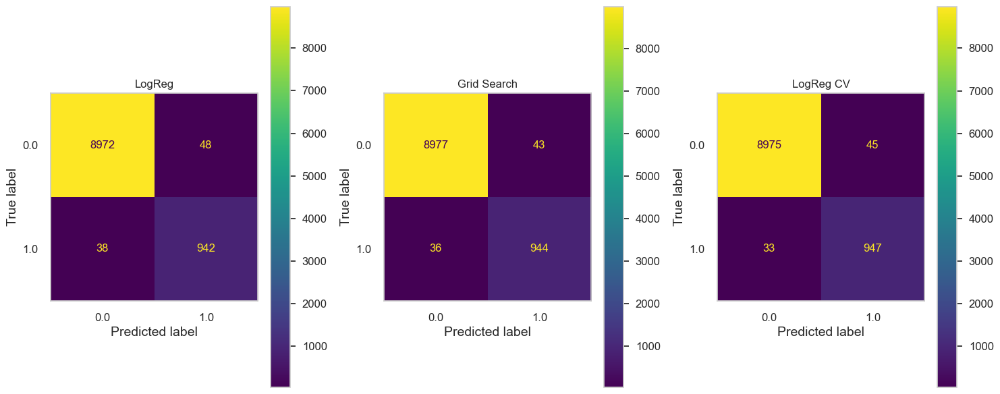

In [102]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15,6))

plot_confusion_matrix(pipe_logit, x_test, y_test_0, ax=axes[0])                        
axes[0].title.set_text("LogReg")
axes[0].grid(False)

plot_confusion_matrix(pipe_logit_cv, x_test, y_test_0, ax=axes[1])                        
axes[1].title.set_text("Grid Search")
axes[1].grid(False)

plot_confusion_matrix(logit_cv, x_test, y_test_0, ax=axes[2])                        
axes[2].title.set_text("LogReg CV")
axes[2].grid(False)

plt.tight_layout() 
plt.show()

# Binary Classification: digit '0' detector : Ridge Classifier

## Modify labels: 0:1, other:-1

In [103]:
# in perceptron we set 0 label to 1 and all other to -1
# in SGDClassifier we  set 0 label to 1 and other to 0 (we are using  sigmoid function [0,1] )
# here in ridge we again set 0 to 1 and others to -1 [-1, +1]
#  ridge classifier casts problem as least square classif problem and uses matrix decomposition

y_train_0 = -1*np.ones((len(y_train))) # all other are set to 0
y_test_0 = -1*np.ones((len(y_test)))

indx_0 = np.where(y_train == "0") # find indexes of digit 0 and set it to 1
y_train_0[indx_0] = 1

indx_0 = np.where(y_test == "0") # find indexes of digit 0
y_test_0[indx_0] = 1

## RidgeClassifier

In [104]:
pipe_ridge = Pipeline(steps=[( "scaler", MinMaxScaler() ),
                             ( "logistic", RidgeClassifier(alpha=0, normalize=False) )])

# no regularization
pipe_ridge.fit(x_train, y_train_0)

Pipeline(steps=[('scaler', MinMaxScaler()),
                ('logistic', RidgeClassifier(alpha=0, normalize=False))])

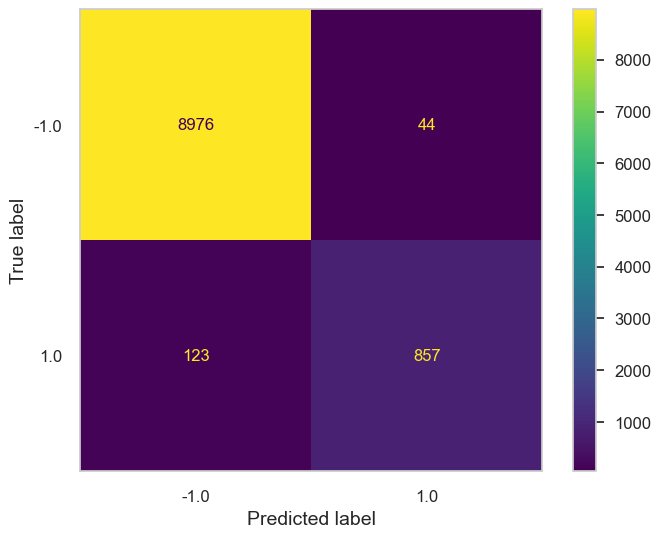

In [105]:
y_hat_test_0 = pipe_ridge.predict(x_test) # using training data
cm_disp = ConfusionMatrixDisplay.from_predictions(y_test_0, y_hat_test_0)
plt.grid(False)
plt.show()

In [106]:
print(classification_report(y_test_0, y_hat_test_0))

              precision    recall  f1-score   support

        -1.0       0.99      1.00      0.99      9020
         1.0       0.95      0.87      0.91       980

    accuracy                           0.98     10000
   macro avg       0.97      0.93      0.95     10000
weighted avg       0.98      0.98      0.98     10000



### Cross Validate

In [107]:
cv_bin_ridge_clf = cross_validate(pipe_ridge,
                      x_train,
                      y_train_0,
                      cv=5,
                      scoring=['precision', 'recall', 'f1'],
                      return_train_score=True,
                      return_estimator=True)

pprint(cv_bin_ridge_clf)

{'estimator': [Pipeline(steps=[('scaler', MinMaxScaler()),
                ('logistic', RidgeClassifier(alpha=0, normalize=False))]),
               Pipeline(steps=[('scaler', MinMaxScaler()),
                ('logistic', RidgeClassifier(alpha=0, normalize=False))]),
               Pipeline(steps=[('scaler', MinMaxScaler()),
                ('logistic', RidgeClassifier(alpha=0, normalize=False))]),
               Pipeline(steps=[('scaler', MinMaxScaler()),
                ('logistic', RidgeClassifier(alpha=0, normalize=False))]),
               Pipeline(steps=[('scaler', MinMaxScaler()),
                ('logistic', RidgeClassifier(alpha=0, normalize=False))])],
 'fit_time': array([9.49898291, 9.81378722, 9.3278923 , 9.17399001, 9.43191338]),
 'score_time': array([0.25133514, 0.14063096, 0.14063287, 0.14615369, 0.14061499]),
 'test_f1': array([0.91461268, 0.90797546, 0.91994693, 0.89720469, 0.90957923]),
 'test_precision': array([0.95496324, 0.9435337 , 0.96654275, 0.96321394, 0.968541

In [108]:
best_estimator_id = np.argmax(cv_bin_ridge_clf["train_f1"])
best_estimator = cv_bin_ridge_clf["estimator"][best_estimator_id]

print(best_estimator_id, best_estimator)

1 Pipeline(steps=[('scaler', MinMaxScaler()),
                ('logistic', RidgeClassifier(alpha=0, normalize=False))])


In [109]:
y_hat_test_0 = best_estimator.predict(x_test) # using training data
print(classification_report(y_test_0, y_hat_test_0))

              precision    recall  f1-score   support

        -1.0       0.99      0.99      0.99      9020
         1.0       0.94      0.89      0.92       980

    accuracy                           0.98     10000
   macro avg       0.97      0.94      0.95     10000
weighted avg       0.98      0.98      0.98     10000



### Digit 0 weights visualization

<Figure size 800x800 with 0 Axes>

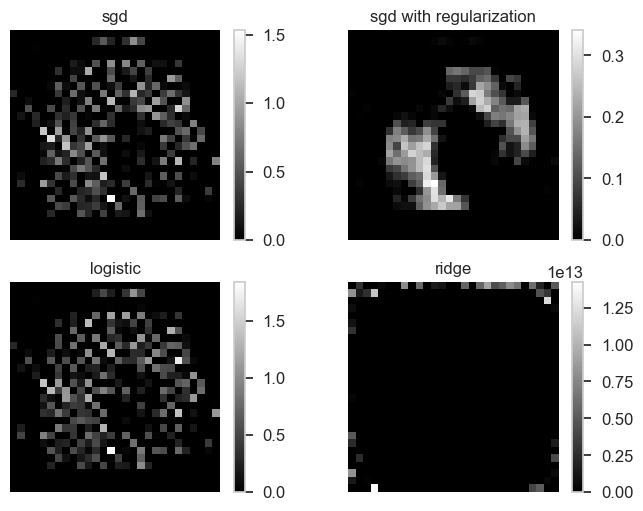

In [112]:
models = [bin_sgd_clf, bin_sgd_clf_l2, pipe_logit, pipe_ridge]
titles = ["sgd", "sgd with regularization", "logistic", "ridge"]

plt.figure(figsize=(8,8))
plt.subplots(2,2)

w = models[0].coef_
w_matrix = w.reshape(28,28)
w_matrix[w_matrix<0]=0
plt.subplot(2,2, 1)
plt.imshow(w_matrix, cmap="gray")
plt.title(titles[0])
plt.axis(False)
plt.grid(False)
plt.colorbar()

w = models[1].coef_
w_matrix = w.reshape(28,28)
w_matrix[w_matrix<0]=0
plt.subplot(2,2, 2)
plt.imshow(w_matrix, cmap="gray")
plt.title(titles[1])
plt.axis(False)
plt.grid(False)
plt.colorbar()

w = models[2][1].coef_
w_matrix = w.reshape(28,28)
w_matrix[w_matrix<0]=0
plt.subplot(2,2, 3)
plt.imshow(w_matrix, cmap="gray")
plt.title(titles[2])
plt.axis(False)
plt.grid(False)
plt.colorbar()

w = models[3][1].coef_
w_matrix = w.reshape(28,28)
w_matrix[w_matrix<0]=0
plt.subplot(2,2, 4)
plt.imshow(w_matrix, cmap="gray")
plt.title(titles[3])
plt.axis(False)
plt.grid(False)
plt.colorbar()

plt.show()

# Multiclass Classification (one vs all)

## Multiclass logit with SGDClassifier

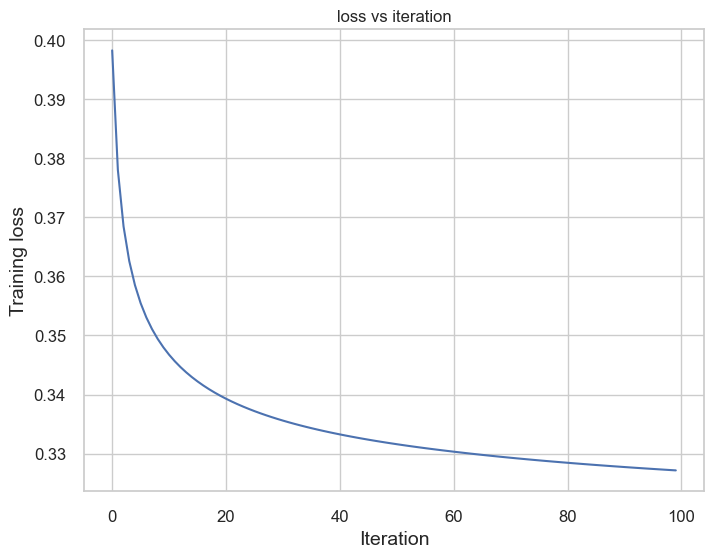

In [114]:
# one vs rest
# its not 0 detector,so not using y_train_0 or y_test_0: Use y_train as it is.
#  when multiclass present, model automatically creates 10 columns one hot encoded
#  then 10 different binary classifier are created and trained
# during prediction, highest score class is output

estimator = SGDClassifier(loss="log",
                        penalty="l2",
                        warm_start=True,
                        eta0=0.01,
                        alpha=0,
                        learning_rate="constant",
                        max_iter=1, 
                        random_state=1729)
# regularization is zero because alpha=0

pipe_sgd_ovr = Pipeline(steps=[( "scaler", MinMaxScaler() ),
                             ( "sgd", estimator )])


Loss = []
iterations = 100
for i in range(iterations):
    pipe_sgd_ovr.fit(x_train, y_train)
    y_pred = pipe_sgd_ovr.predict_proba(x_train)
    Loss.append(log_loss(y_train, y_pred))
    
plt.figure(figsize=(8,6))
plt.plot(np.arange(iterations), Loss, "b-")
plt.ylabel("Training loss")
plt.xlabel("Iteration")
plt.title("loss vs iteration")
plt.grid(True)
plt.show()

In [115]:
# shape of weight matrix
pipe_sgd_ovr[1].coef_.shape # 10 x 784

(10, 784)

In [116]:
y_hat = pipe_sgd_ovr.predict(x_test)
y_hat[:5]

array(['7', '2', '1', '0', '4'], dtype='<U1')

<Figure size 400x400 with 0 Axes>

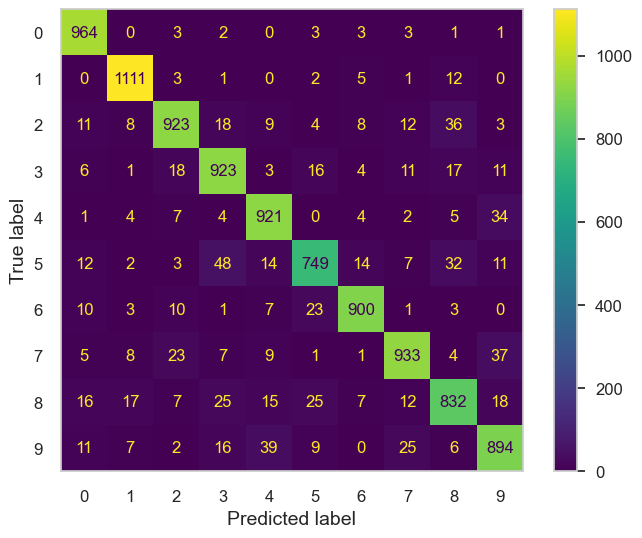

In [117]:
plt.figure(figsize=(4,4))
cm_disp = ConfusionMatrixDisplay.from_predictions(y_test, y_hat)
plt.grid(False)
plt.show()

In [118]:
print(classification_report(y_test, y_hat))

              precision    recall  f1-score   support

           0       0.93      0.98      0.96       980
           1       0.96      0.98      0.97      1135
           2       0.92      0.89      0.91      1032
           3       0.88      0.91      0.90      1010
           4       0.91      0.94      0.92       982
           5       0.90      0.84      0.87       892
           6       0.95      0.94      0.95       958
           7       0.93      0.91      0.92      1028
           8       0.88      0.85      0.87       974
           9       0.89      0.89      0.89      1009

    accuracy                           0.92     10000
   macro avg       0.91      0.91      0.91     10000
weighted avg       0.91      0.92      0.91     10000



## Multiclass logistic regression using solvers

In [119]:
pipe_logit_ovr = Pipeline(steps=[( "scaler", MinMaxScaler() ),
                             ( "logit", LogisticRegression(solver="lbfgs",
                                                          C=np.infty,
                                                          random_state=1729) )])
pipe_logit_ovr.fit(x_train, y_train)

Pipeline(steps=[('scaler', MinMaxScaler()),
                ('logit', LogisticRegression(C=inf, random_state=1729))])

In [120]:
print(f"Training accuracy: {round(pipe_logit_ovr.score(x_train, y_train), 3)}")
print(f"Test accuracy: {round(pipe_logit_ovr.score(x_test, y_test), 3)}")

Training accuracy: 0.935
Test accuracy: 0.925


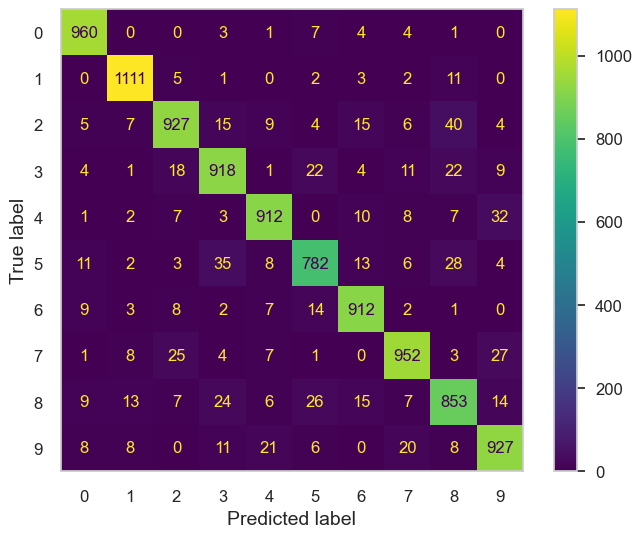

In [121]:
y_hat = pipe_logit_ovr.predict(x_test)
cm_disp = ConfusionMatrixDisplay.from_predictions(y_test, y_hat)
plt.grid(False)
plt.show()

In [122]:
print(classification_report(y_test, y_hat)) # f1 score is better than sgd classifier

              precision    recall  f1-score   support

           0       0.95      0.98      0.97       980
           1       0.96      0.98      0.97      1135
           2       0.93      0.90      0.91      1032
           3       0.90      0.91      0.91      1010
           4       0.94      0.93      0.93       982
           5       0.91      0.88      0.89       892
           6       0.93      0.95      0.94       958
           7       0.94      0.93      0.93      1028
           8       0.88      0.88      0.88       974
           9       0.91      0.92      0.92      1009

    accuracy                           0.93     10000
   macro avg       0.92      0.92      0.92     10000
weighted avg       0.93      0.93      0.93     10000



# Multiclass Classification: Logistic reg using Softmax Regression

## Model building

In [123]:
# this time we use StandardScaler and Logistic regression 
# with solver="sag" and  multi_class="multinomial"
#  this is not one vs one or one vs rest. We  solve it directly with 
# softmax regression (when multi_class="multinomial" is set)

pipe_logit_sag = Pipeline(steps=[( "scaler", StandardScaler() ),
                             ( "logit", LogisticRegression(solver="sag",
                                                          multi_class="multinomial") )])

pipe_logit_sag.fit(x_train, y_train)

Pipeline(steps=[('scaler', StandardScaler()),
                ('logit',
                 LogisticRegression(multi_class='multinomial', solver='sag'))])

In [124]:
pipe_logit_sag[1].coef_.shape

(10, 784)

In [125]:
pipe_logit_sag[1].intercept_.shape

(10,)

In [126]:
pipe_logit_sag[1].classes_

array(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9'], dtype=object)

## Model evaluation

In [127]:
y_hat = pipe_logit_sag.predict(x_test)
print(classification_report(y_test, y_hat)) # f1 score is greater than 0.90 considered to be Good score

              precision    recall  f1-score   support

           0       0.95      0.98      0.97       980
           1       0.96      0.98      0.97      1135
           2       0.94      0.90      0.92      1032
           3       0.91      0.91      0.91      1010
           4       0.92      0.94      0.93       982
           5       0.91      0.87      0.89       892
           6       0.93      0.95      0.94       958
           7       0.92      0.93      0.92      1028
           8       0.88      0.88      0.88       974
           9       0.91      0.90      0.91      1009

    accuracy                           0.92     10000
   macro avg       0.92      0.92      0.92     10000
weighted avg       0.92      0.92      0.92     10000



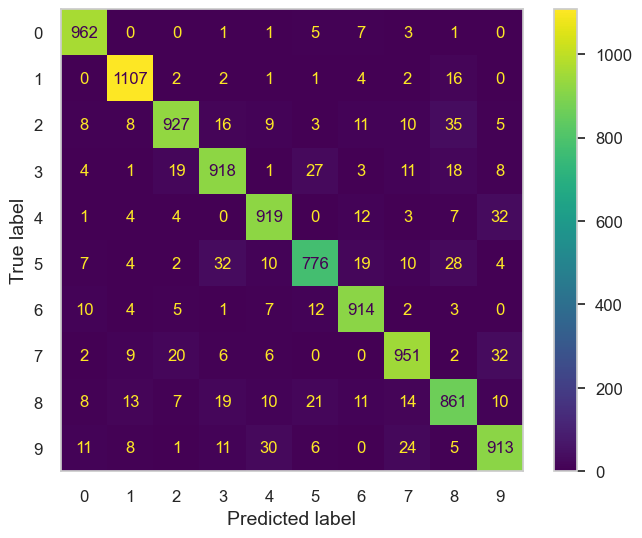

In [128]:
cm_disp = ConfusionMatrixDisplay.from_predictions(y_test, y_hat)
plt.grid(False)
plt.show()

## Using LogisticRegressionCV

In [131]:
# # Dont run, Takes a lot of hours

# scorer = make_scorer(f1_score, average="micro")

# pipe_logit_sag_cv = Pipeline(steps=[( "scaler", StandardScaler() ),
#                              ( "logit", LogisticRegressionCV(solver="sag",
#                                                           multi_class="multinomial",
#                                                             cv=5,
#                                                             random_state=1729,
#                                                             scoring=scorer,
#                                                             max_iter=100) 
#                              )])



# pipe_logit_sag_cv.fit(x_train, y_train)

In [132]:
# pipe_logit_sag_cv[1].C_

In [133]:
# pipe_logit_sag_cv[1].l1_ratio_

### Model evaluation

In [134]:
# y_hat = pipe_logit_sag_cv.predict(x_test)
# print(classification_report(y_test, y_hat)) # f1 score is greater than 0.90 considered to be Good score

In [135]:
# cm_disp = ConfusionMatrixDisplay.from_predictions(y_test, y_hat)
# plt.grid(False)
# plt.show()

# Binary Classification: digit '0' detector : KNeighborsClassifier

## Labeling: -1, 1

In [8]:
# in perceptron we set 0 label to 1 and all other to -1

y_train_0 = -1*np.ones((len(y_train))) # all other are set to 0
y_test_0 = -1*np.ones((len(y_test)))

indx_0 = np.where(y_train == "0") # find indexes of digit 0 and set it to 1
y_train_0[indx_0] = 1

indx_0 = np.where(y_test == "0") # find indexes of digit 0
y_test_0[indx_0] = 1

## Visualization in lower dimension

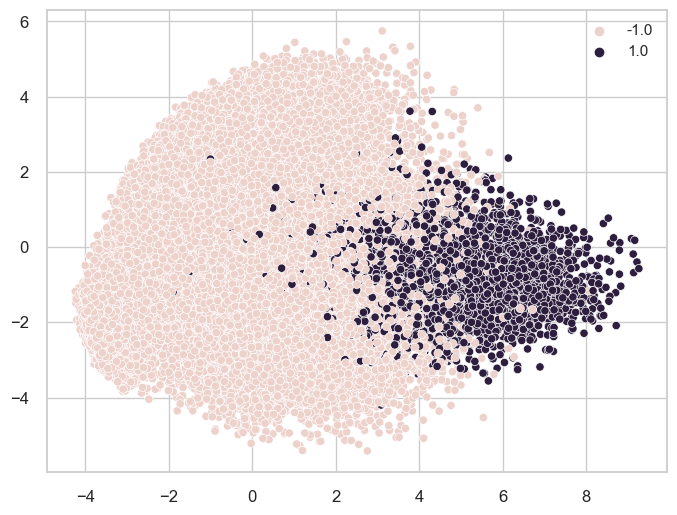

In [9]:
pipe_pca_2d = Pipeline(steps=[("scaler", MinMaxScaler()),
                             ("pca", PCA(n_components=2))])

x_train_pca_2d = pipe_pca_2d.fit_transform(x_train)

cmap = ListedColormap(['r', 'b'])
plt.figure(figsize=(8,6))
sns.scatterplot(x=x_train_pca_2d[:,0], y=x_train_pca_2d[:,1], hue=y_train_0, palette=cmap)
plt.show()

## Visualization in 3D dimension

In [11]:
pipe_pca_3d = Pipeline(steps=[("scaler", MinMaxScaler()),
                             ("pca", PCA(n_components=3))])

x_train_pca_3d = pipe_pca_3d.fit_transform(x_train)

fig = px.scatter_3d(x=x_train_pca_3d[:,0], 
                    y=x_train_pca_3d[:,1],
                    z=x_train_pca_3d[:,2],
                    color=y_train_0,
                    opacity=0.5
                   )

fig.show() # its interactive visualization
# https://plotly.com/python/getting-started/#jupyterlab-support-python-35

## KNN Classifier

In [13]:
pipe_pca_2d = Pipeline(steps=[("scaler", MinMaxScaler()),
                             ("pca", PCA(n_components=2))])

pipe_clf_pca_2d = Pipeline(steps=[("pipe_pca_2d", pipe_pca_2d),
                             ("knn", KNeighborsClassifier(n_neighbors=3))])

# create small dataset to work on
# knn is computationally expensive and takes a lot of time on large dataset

# taking 5 positive samples and 5 negative 

index_neg = np.argsort(y_train_0)[:5]
index_pos = np.argsort(y_train_0)[-1:-6:-1]

print(f"Pos: {y_train_0[index_pos]}")
print(f"Neg: {y_train_0[index_neg]}")

x = np.vstack( (x_train[index_pos, :], x_train[index_neg,:]) )
y = np.hstack( (y_train_0[index_pos], y_train_0[index_neg]) )

print(f"x shape: {x.shape}")
print(f"y shape: {y.shape}")

Pos: [1. 1. 1. 1. 1.]
Neg: [-1. -1. -1. -1. -1.]
x shape: (10, 784)
y shape: (10,)


In [16]:
pipe_clf_pca_2d.fit(x,y)

Pipeline(steps=[('pipe_pca_2d',
                 Pipeline(steps=[('scaler', MinMaxScaler()),
                                 ('pca', PCA(n_components=2))])),
                ('knn', KNeighborsClassifier(n_neighbors=3))])

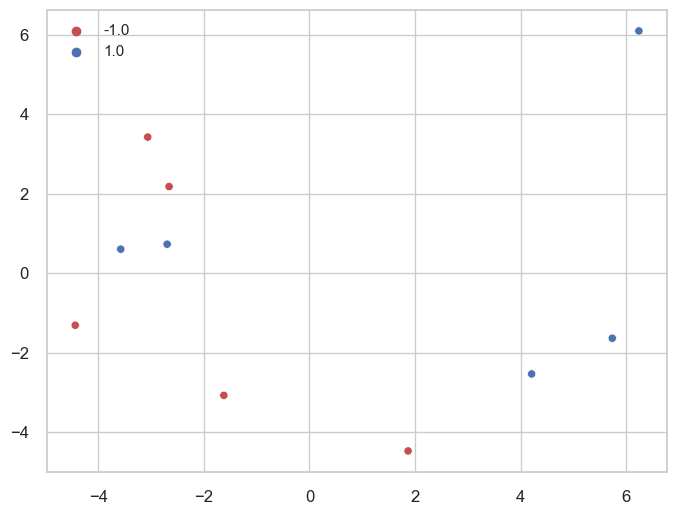

In [20]:
# visualize
x_reduced = pipe_clf_pca_2d[0].transform(x)
cmap = ListedColormap(['r', 'b'])

plt.figure(figsize=(8,6))
sns.scatterplot(x=x_reduced[:,0], y=x_reduced[:,1], hue=y, markers="o", palette=cmap)
plt.show()

In [21]:
x_test.shape

(10000, 784)

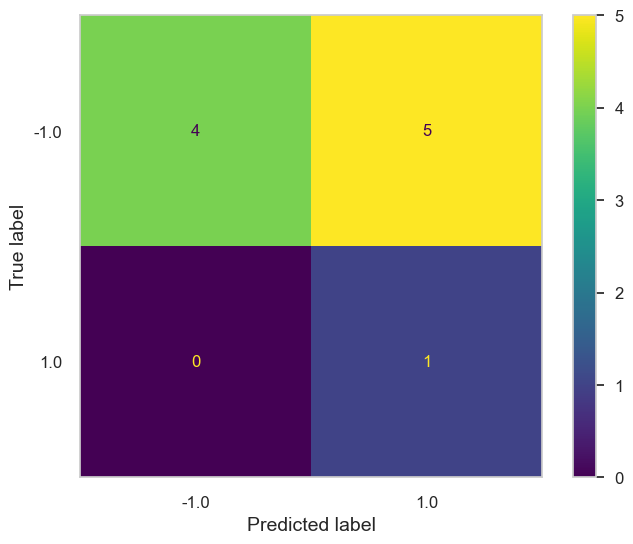

In [22]:
y_hat_0 = pipe_clf_pca_2d.predict(x_test[:10, :])
cm_disp = ConfusionMatrixDisplay.from_predictions(y_test_0[:10], y_hat_0)
plt.grid(False)
plt.show()

In [23]:
print(classification_report(y_test_0[:10], y_hat_0))

              precision    recall  f1-score   support

        -1.0       1.00      0.44      0.62         9
         1.0       0.17      1.00      0.29         1

    accuracy                           0.50        10
   macro avg       0.58      0.72      0.45        10
weighted avg       0.92      0.50      0.58        10



In [24]:
#  only 10 examples but very poor performance

## Get nearest neighbors distance

In [26]:
# KNeKNeighborsClassifier internally uses NearestNeighbors

neighbours = NearestNeighbors(n_neighbors=3)
neighbours.fit(pipe_pca_2d.transform(x))

dist_neigh, idx_neigh = neighbours.kneighbors(pipe_pca_2d.transform(x_test[:10]), 3, return_distance=True)


In [28]:
for i in range(3):
    print("-"*50)
    print(f"Distance: {dist_neigh[i]}")
    print(f"Index: {idx_neigh[i]}")
    print(f"Label: {y[idx_neigh[i].flatten()]}")
    print(f"Pred: { mode(y[idx_neigh[i].flatten()]) }")

--------------------------------------------------
Distance: [1.54510433 1.56004731 1.61914472]
Index: [1 4 6]
Label: [ 1.  1. -1.]
Pred: 1.0
--------------------------------------------------
Distance: [0.95703587 3.33077652 3.39001596]
Index: [7 1 6]
Label: [-1.  1. -1.]
Pred: -1.0
--------------------------------------------------
Distance: [1.14297879 2.0379748  2.22709669]
Index: [6 4 1]
Label: [-1.  1.  1.]
Pred: 1.0


## Training with 10000 samples

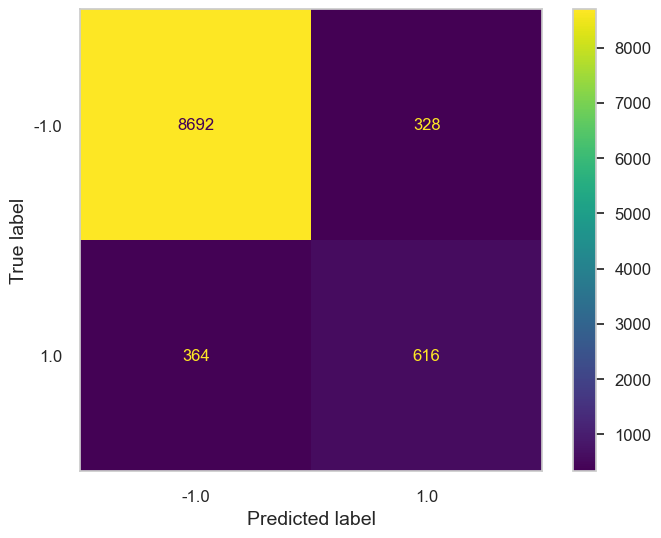

In [29]:
pipe_clf_pca_2d.fit(x_train[:10000], y_train_0[:10000])

y_hat_0 = pipe_clf_pca_2d.predict(x_test)
cm_disp = ConfusionMatrixDisplay.from_predictions(y_test_0, y_hat_0)
plt.grid(False)
plt.show()

In [30]:
print(classification_report(y_test_0, y_hat_0))

              precision    recall  f1-score   support

        -1.0       0.96      0.96      0.96      9020
         1.0       0.65      0.63      0.64       980

    accuracy                           0.93     10000
   macro avg       0.81      0.80      0.80     10000
weighted avg       0.93      0.93      0.93     10000



In [31]:
#  Poor performance for positive class

## Training with 10000 samples without PCA

              precision    recall  f1-score   support

        -1.0       1.00      1.00      1.00      9020
         1.0       0.96      0.99      0.97       980

    accuracy                           0.99     10000
   macro avg       0.98      0.99      0.99     10000
weighted avg       1.00      0.99      0.99     10000



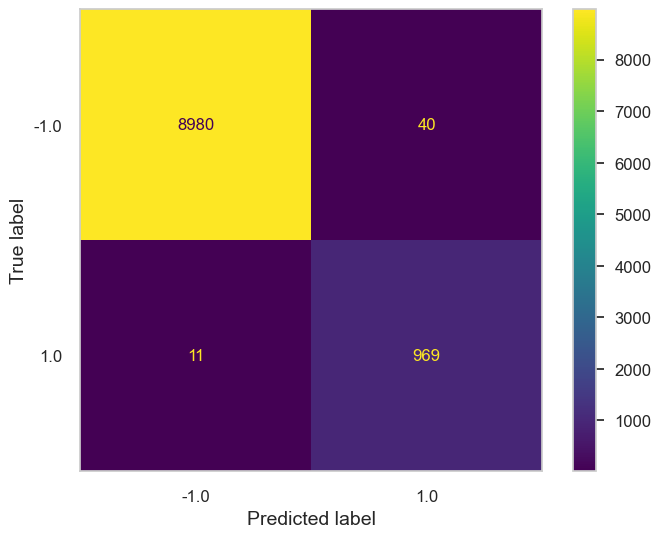

In [32]:
pipe_knn = Pipeline(steps=[("scaler", MinMaxScaler()),
                             ("knn", KNeighborsClassifier(n_neighbors=3))])

pipe_knn.fit(x_train[:10000], y_train_0[:10000])

y_hat_0 = pipe_knn.predict(x_test)

print(classification_report(y_test_0, y_hat_0))

cm_disp = ConfusionMatrixDisplay.from_predictions(y_test_0, y_hat_0)
plt.grid(False)
plt.show()

In [33]:
#  without PCA we get much better score

## GridSearch with 10000 samples without PCA 

In [34]:
#  using all 60k samples will take huge amount of time 

pipe_knn = Pipeline(steps=[("scaler", MinMaxScaler()),
                             ("knn", KNeighborsClassifier(n_neighbors=1))])

param_grid = {"knn__n_neighbors": [1,3,5,7,9]}

knn_gs = GridSearchCV(pipe_knn, param_grid=param_grid, scoring="precision", cv=2)

knn_gs.fit(x_train[:10000], y_train_0[:10000])

print(knn_gs.cv_results_)

{'mean_fit_time': array([0.11405575, 0.08706522, 0.10002112, 0.08006012, 0.09109998]), 'std_fit_time': array([0.02030408, 0.00893641, 0.01198339, 0.001876  , 0.01290369]), 'mean_score_time': array([1.30261123, 1.46725357, 1.61563671, 1.67705119, 1.7394973 ]), 'std_score_time': array([0.03603566, 0.15410936, 0.08803475, 0.175367  , 0.1159085 ]), 'param_knn__n_neighbors': masked_array(data=[1, 3, 5, 7, 9],
             mask=[False, False, False, False, False],
       fill_value='?',
            dtype=object), 'params': [{'knn__n_neighbors': 1}, {'knn__n_neighbors': 3}, {'knn__n_neighbors': 5}, {'knn__n_neighbors': 7}, {'knn__n_neighbors': 9}], 'split0_test_score': array([0.95357834, 0.95703125, 0.97410359, 0.9760479 , 0.96825397]), 'split1_test_score': array([0.96296296, 0.96484375, 0.96303502, 0.96484375, 0.96484375]), 'mean_test_score': array([0.95827065, 0.9609375 , 0.9685693 , 0.97044583, 0.96654886]), 'std_test_score': array([0.00469231, 0.00390625, 0.00553428, 0.00560208, 0.0017051

In [35]:
knn_gs.best_params_

{'knn__n_neighbors': 7}

In [36]:
knn_gs.best_estimator_

Pipeline(steps=[('scaler', MinMaxScaler()),
                ('knn', KNeighborsClassifier(n_neighbors=7))])

              precision    recall  f1-score   support

        -1.0       1.00      1.00      1.00      9020
         1.0       0.96      0.99      0.97       980

    accuracy                           0.99     10000
   macro avg       0.98      0.99      0.98     10000
weighted avg       0.99      0.99      0.99     10000



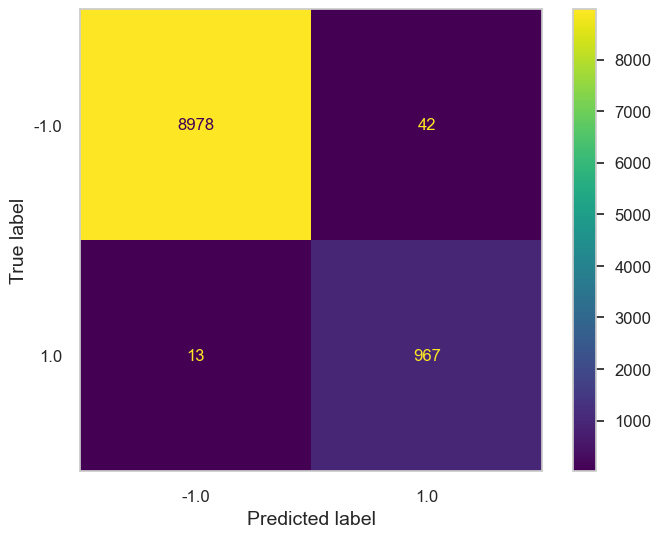

In [37]:
y_hat_0 = knn_gs.best_estimator_.predict(x_test)

print(classification_report(y_test_0, y_hat_0))

cm_disp = ConfusionMatrixDisplay.from_predictions(y_test_0, y_hat_0)
plt.grid(False)
plt.show()

# Multiclass Classification: KNeighborsClassifier

              precision    recall  f1-score   support

           0       0.97      0.99      0.98       980
           1       0.95      1.00      0.97      1135
           2       0.98      0.96      0.97      1032
           3       0.97      0.97      0.97      1010
           4       0.98      0.96      0.97       982
           5       0.97      0.97      0.97       892
           6       0.98      0.99      0.98       958
           7       0.96      0.96      0.96      1028
           8       0.99      0.94      0.96       974
           9       0.96      0.95      0.96      1009

    accuracy                           0.97     10000
   macro avg       0.97      0.97      0.97     10000
weighted avg       0.97      0.97      0.97     10000



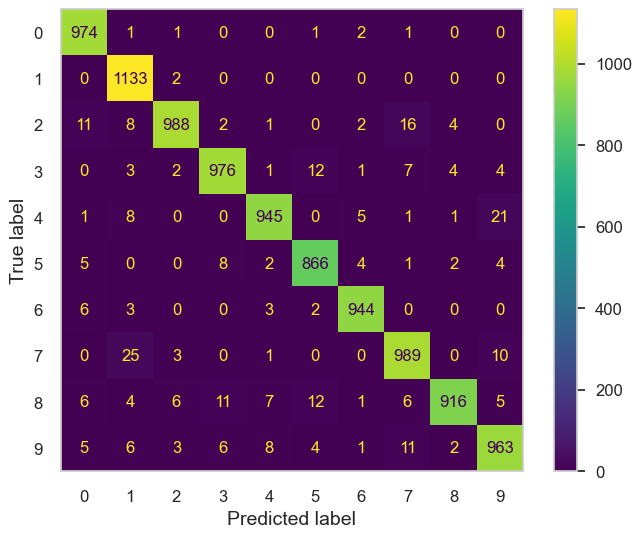

In [40]:
pipe_knn = Pipeline(steps=[('scaler', MinMaxScaler()),
                ('knn', KNeighborsClassifier(n_neighbors=7))])

pipe_knn.fit(x_train, y_train)

y_hat = pipe_knn.predict(x_test)

print(classification_report(y_test, y_hat))

cm_disp = ConfusionMatrixDisplay.from_predictions(y_test, y_hat)
plt.grid(False)
plt.show()

In [41]:
#  all f1 scores are above 0.95 means it is much better model

# Binary Classification: digit '0' detector : Support Vector Classifier

## Load data

In [53]:
# # Takes a lot of time for downloading dataset
# X, y = fetch_openml("mnist_784", version=1, return_X_y=True) # returns tuple of data dataframe and label dataframe
# print(f"Shape of X: {X.shape}") # pixels per image = 784 = 28*28
# print(f"Shape of y: {y.shape}")

# # Shape of X: (70000, 784)
# # Shape of y: (70000,)

Shape of X: (70000, 784)
Shape of y: (70000,)


In [54]:
# Converts pandas object to np array
X = X.to_numpy()
y = y.to_numpy()

In [55]:
print(f"X shape: {X.shape}\ny shape: {y.shape}")

X shape: (70000, 784)
y shape: (70000,)


In [56]:
XX = MinMaxScaler().fit_transform(X)
print(f"Min val: {XX.min()} | Max val: {XX.max()}")

Min val: 0.0 | Max val: 1.0


In [57]:
#  lets consider only 10000 images

train_samp = 10000
test_samp = 2000
x_train, x_test, y_train, y_test = XX[0:train_samp, :], XX[0:test_samp,:], y[0:train_samp], y[0:test_samp] 

print(f"X train shape: {x_train.shape}\ny train shape: {y_train.shape}")
print(f"X test shape: {x_test.shape}\ny test shape: {y_test.shape}")

X train shape: (10000, 784)
y train shape: (10000,)
X test shape: (2000, 784)
y test shape: (2000,)


## Multiclass classification: Linear SVM

In [60]:
pipe_svm_linear = Pipeline(steps=[("scaler", MinMaxScaler()),
                                 ('classifier', SVC(kernel='linear', C=1))])
pipe_svm_linear.fit(x_train, y_train)

acc = cross_val_score(pipe_svm_linear, x_train, y_train, cv=2)
print(f"Train acc: {acc.mean()}")

Train acc: 0.9107000000000001


              precision    recall  f1-score   support

           0       1.00      1.00      1.00       191
           1       1.00      1.00      1.00       220
           2       1.00      1.00      1.00       198
           3       0.99      1.00      1.00       191
           4       1.00      1.00      1.00       214
           5       1.00      0.99      1.00       180
           6       1.00      1.00      1.00       200
           7       0.99      1.00      0.99       224
           8       1.00      1.00      1.00       172
           9       1.00      0.99      0.99       210

    accuracy                           1.00      2000
   macro avg       1.00      1.00      1.00      2000
weighted avg       1.00      1.00      1.00      2000



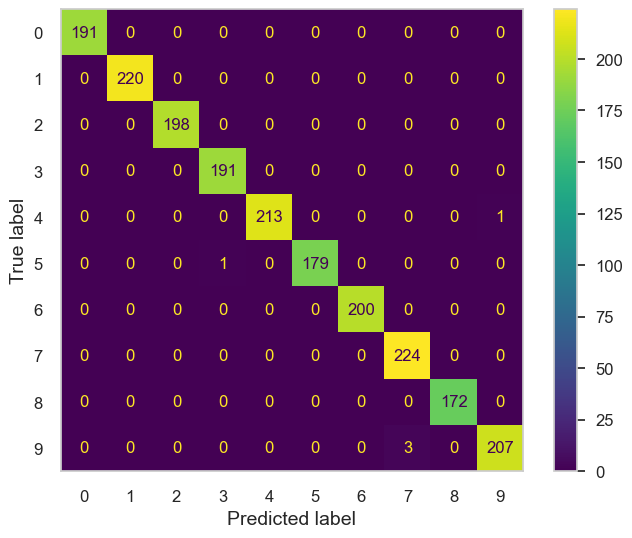

In [63]:
y_hat = pipe_svm_linear.predict(x_test)

print(classification_report(y_test, y_hat))

cm_disp = ConfusionMatrixDisplay.from_predictions(y_test, y_hat)
plt.grid(False)
plt.show()

## Multiclass classification: Non Linear SVM

In [66]:
pipe_svm_nonlinear = Pipeline(steps=[("scaler", MinMaxScaler()),
                                 ('classifier', SVC(kernel='rbf', C=1, gamma=0.1))])
pipe_svm_nonlinear.fit(x_train, y_train)

acc = cross_val_score(pipe_svm_nonlinear, x_train, y_train, cv=2)
print(f"Train acc: {acc.mean()}")

Train acc: 0.8286


              precision    recall  f1-score   support

           0       1.00      1.00      1.00       191
           1       1.00      1.00      1.00       220
           2       1.00      1.00      1.00       198
           3       1.00      1.00      1.00       191
           4       1.00      1.00      1.00       214
           5       1.00      1.00      1.00       180
           6       1.00      1.00      1.00       200
           7       1.00      1.00      1.00       224
           8       1.00      1.00      1.00       172
           9       1.00      1.00      1.00       210

    accuracy                           1.00      2000
   macro avg       1.00      1.00      1.00      2000
weighted avg       1.00      1.00      1.00      2000



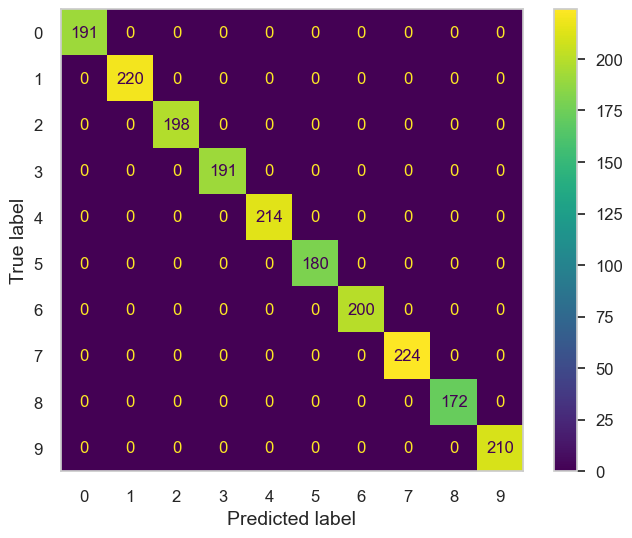

In [67]:
y_hat = pipe_svm_nonlinear.predict(x_test)

print(classification_report(y_test, y_hat))

cm_disp = ConfusionMatrixDisplay.from_predictions(y_test, y_hat)
plt.grid(False)
plt.show()

## GridSearchCV for non linear svm

In [ ]:
# #  Dont run. Takes a lot of time

# pipe_svm_nonlinear_gs = Pipeline(steps=[("scaler", StandardScaler()),
#                                  ('classifier', SVC(kernel='rbf', C=1, gamma=0.1))])

# C_range =  np.logspace(-2, 10, 13)
# gamma_range = np.logspace(-9, 3, 13)

# param_grid = {"classifier__C": C_range,
#              "classifier__gamma": gamma_range}

# cv = StratifiedShuffleSplit(n_splits=3, test_size=0.2, random_state=42)
# svm_nonlinear_gs = GridSearchCV(pipe_svm_nonlinear_gs, param_grid=param_grid, cv=cv)

# svm_nonlinear_gs.fit(x_train, y_train)


# END